# PACKAGES AND LIBRARIES

In [1]:
#GENERAL
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#PATH PROCESS
import os
import os.path
from pathlib import Path
import glob
#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
#OPTIMIZER
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer
#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN, LSTM, GlobalAveragePooling2D, SeparableConv2D
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model
#SKLEARN CLASSIFIER
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
#IGNORING WARNINGS
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

# PATH & LABEL PROCESS

#### MAIN PATH

In [2]:
Fire_Dataset_Path = Path("C:/Users/M_Aly/OneDrive - National University of Sciences & Technology/Documents/6th Semester/Digital Image Processing/DIP_Project/fire_dataset")

#### PATH PROCESS

In [3]:
PNG_Path = list(Fire_Dataset_Path.glob(r"*/*.png"))

#### LABEL PROCESS

In [4]:
PNG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],PNG_Path))

In [5]:
print("FIRE: ", PNG_Labels.count("fire_images"))
print("NO_FIRE: ", PNG_Labels.count("non_fire_images"))

FIRE:  755
NO_FIRE:  244


# TRANSFORMATION TO SERIES STRUCTURE

In [6]:
PNG_Path_Series = pd.Series(PNG_Path,name="PNG").astype(str)
PNG_Labels_Series = pd.Series(PNG_Labels,name="CATEGORY")

In [7]:
print(PNG_Path_Series)

0      C:\Users\M_Aly\OneDrive - National University ...
1      C:\Users\M_Aly\OneDrive - National University ...
2      C:\Users\M_Aly\OneDrive - National University ...
3      C:\Users\M_Aly\OneDrive - National University ...
4      C:\Users\M_Aly\OneDrive - National University ...
                             ...                        
994    C:\Users\M_Aly\OneDrive - National University ...
995    C:\Users\M_Aly\OneDrive - National University ...
996    C:\Users\M_Aly\OneDrive - National University ...
997    C:\Users\M_Aly\OneDrive - National University ...
998    C:\Users\M_Aly\OneDrive - National University ...
Name: PNG, Length: 999, dtype: object


In [8]:
print(PNG_Labels_Series)

0          fire_images
1          fire_images
2          fire_images
3          fire_images
4          fire_images
            ...       
994    non_fire_images
995    non_fire_images
996    non_fire_images
997    non_fire_images
998    non_fire_images
Name: CATEGORY, Length: 999, dtype: object


In [9]:
PNG_Labels_Series.replace({"non_fire_images":"NO_FIRE","fire_images":"FIRE"},inplace=True)

In [10]:
print(PNG_Labels_Series)

0         FIRE
1         FIRE
2         FIRE
3         FIRE
4         FIRE
        ...   
994    NO_FIRE
995    NO_FIRE
996    NO_FIRE
997    NO_FIRE
998    NO_FIRE
Name: CATEGORY, Length: 999, dtype: object


# TRANSFORMATION TO DATAFRAME STRUCTURE

In [11]:
Main_Train_Data = pd.concat([PNG_Path_Series,PNG_Labels_Series],axis=1)

In [12]:
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    C:\Users\M_Aly\OneDrive - National University ...     FIRE
1    C:\Users\M_Aly\OneDrive - National University ...     FIRE
2    C:\Users\M_Aly\OneDrive - National University ...     FIRE
3    C:\Users\M_Aly\OneDrive - National University ...     FIRE
4    C:\Users\M_Aly\OneDrive - National University ...     FIRE
..                                                 ...      ...
993  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
994  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
995  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
996  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
997  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE

[998 rows x 2 columns]


#### SHUFFLING

In [13]:
Main_Train_Data = Main_Train_Data.sample(frac=1).reset_index(drop=True)

In [14]:
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    C:\Users\M_Aly\OneDrive - National University ...     FIRE
1    C:\Users\M_Aly\OneDrive - National University ...     FIRE
2    C:\Users\M_Aly\OneDrive - National University ...     FIRE
3    C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
4    C:\Users\M_Aly\OneDrive - National University ...     FIRE
..                                                 ...      ...
993  C:\Users\M_Aly\OneDrive - National University ...     FIRE
994  C:\Users\M_Aly\OneDrive - National University ...     FIRE
995  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
996  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
997  C:\Users\M_Aly\OneDrive - National University ...     FIRE

[998 rows x 2 columns]


In [15]:
print(Main_Train_Data["PNG"][2])
print(Main_Train_Data["CATEGORY"][2])
print(Main_Train_Data["PNG"][200])
print(Main_Train_Data["CATEGORY"][200])
print(Main_Train_Data["PNG"][45])
print(Main_Train_Data["CATEGORY"][45])
print(Main_Train_Data["PNG"][852])
print(Main_Train_Data["CATEGORY"][852])

C:\Users\M_Aly\OneDrive - National University of Sciences & Technology\Documents\6th Semester\Digital Image Processing\DIP_Project\fire_dataset\fire_images\fire.397.png
FIRE
C:\Users\M_Aly\OneDrive - National University of Sciences & Technology\Documents\6th Semester\Digital Image Processing\DIP_Project\fire_dataset\fire_images\fire.679.png
FIRE
C:\Users\M_Aly\OneDrive - National University of Sciences & Technology\Documents\6th Semester\Digital Image Processing\DIP_Project\fire_dataset\fire_images\fire.540.png
FIRE
C:\Users\M_Aly\OneDrive - National University of Sciences & Technology\Documents\6th Semester\Digital Image Processing\DIP_Project\fire_dataset\non_fire_images\non_fire.233.png
NO_FIRE


In [16]:
remove_PNG = 'C:/Users/M_Aly/OneDrive - National University of Sciences & Technology/Documents/6th Semester/Digital Image Processing/DIP_Project/fire_dataset/non_fire_images/non_fire.189.png'
Main_Train_Data = Main_Train_Data.loc[~(Main_Train_Data.loc[:,'PNG'] == remove_PNG),:]

In [17]:
print(Main_Train_Data.loc[Main_Train_Data.loc[:,'PNG'] == remove_PNG,:])

Empty DataFrame
Columns: [PNG, CATEGORY]
Index: []


* We need to remove Non_Fire_189, this PNG is broken

In [18]:
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    C:\Users\M_Aly\OneDrive - National University ...     FIRE
1    C:\Users\M_Aly\OneDrive - National University ...     FIRE
2    C:\Users\M_Aly\OneDrive - National University ...     FIRE
3    C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
4    C:\Users\M_Aly\OneDrive - National University ...     FIRE
..                                                 ...      ...
993  C:\Users\M_Aly\OneDrive - National University ...     FIRE
994  C:\Users\M_Aly\OneDrive - National University ...     FIRE
995  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
996  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
997  C:\Users\M_Aly\OneDrive - National University ...     FIRE

[998 rows x 2 columns]


# VISUALIZATION

In [19]:
plt.style.use("dark_background")

#### GENERAL

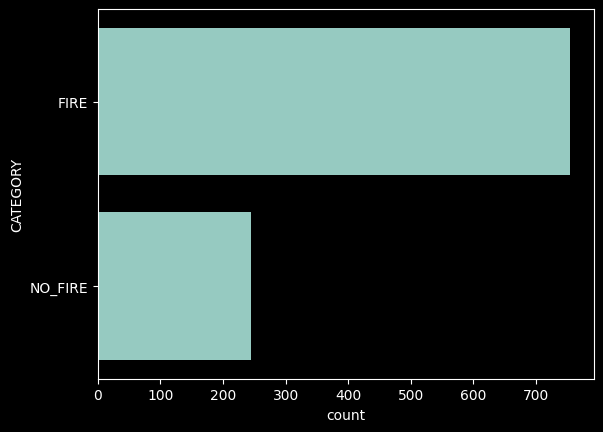

In [20]:
sns.countplot(Main_Train_Data["CATEGORY"])
plt.show()

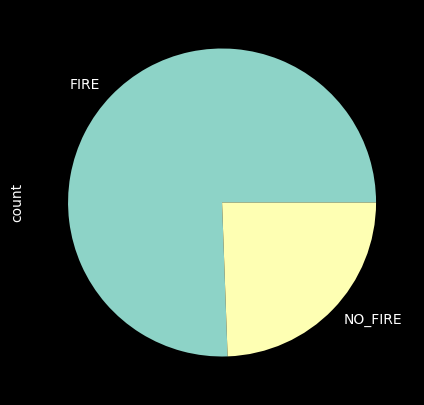

In [21]:
Main_Train_Data['CATEGORY'].value_counts().plot.pie(figsize=(5,5))
plt.show()

#### IMAGES

Text(0.5, 1.0, 'FIRE')

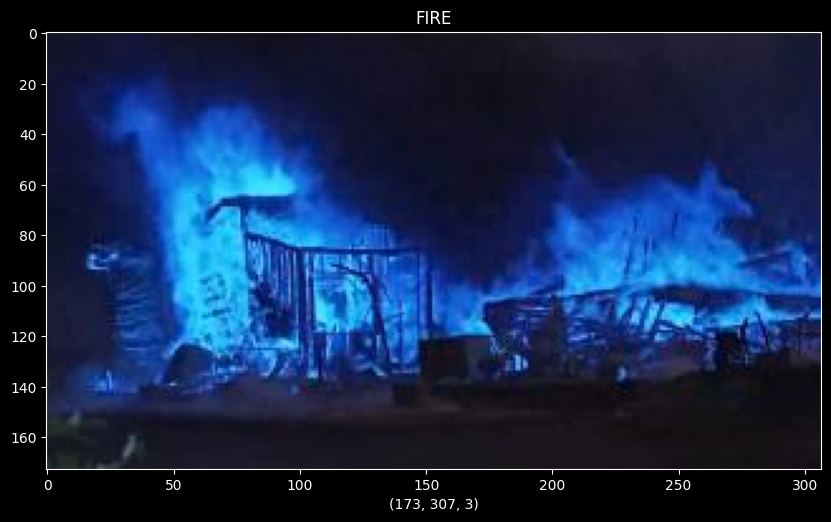

In [22]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][0])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][0])

Text(0.5, 1.0, 'FIRE')

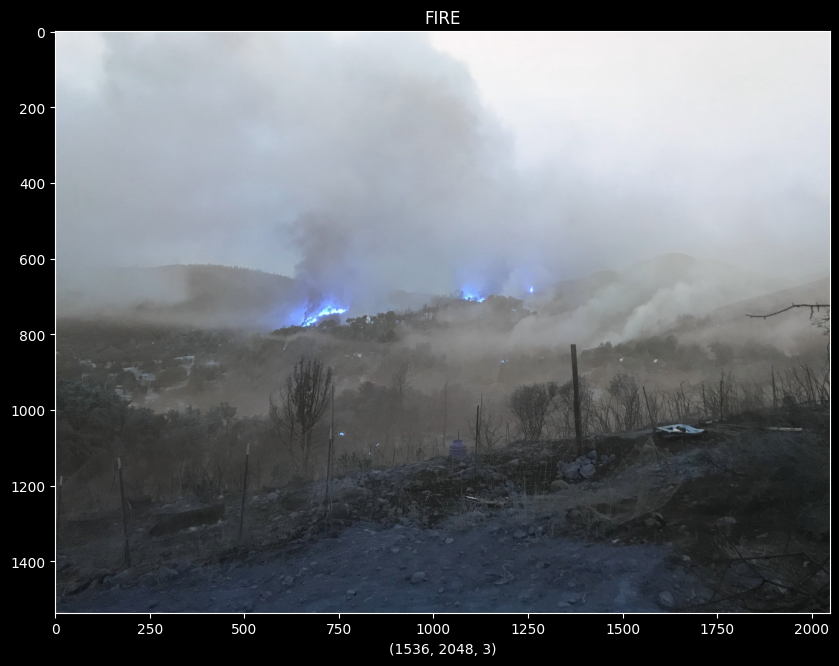

In [23]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][993])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][993])

Text(0.5, 1.0, 'FIRE')

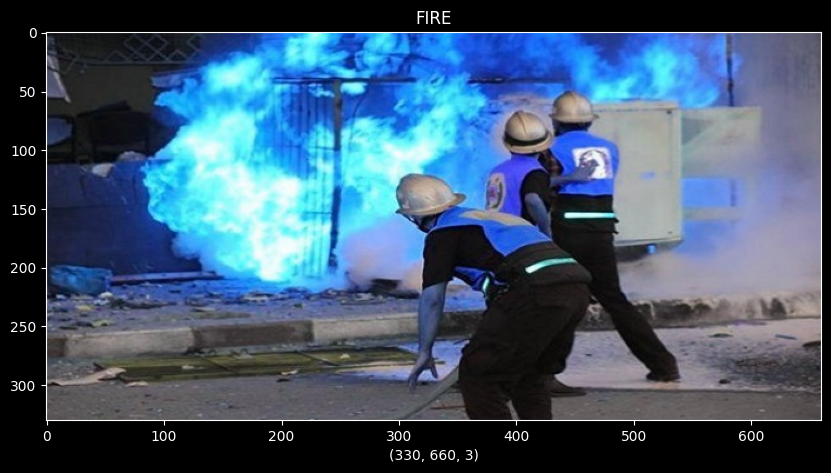

In [24]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][20])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][20])

Text(0.5, 1.0, 'FIRE')

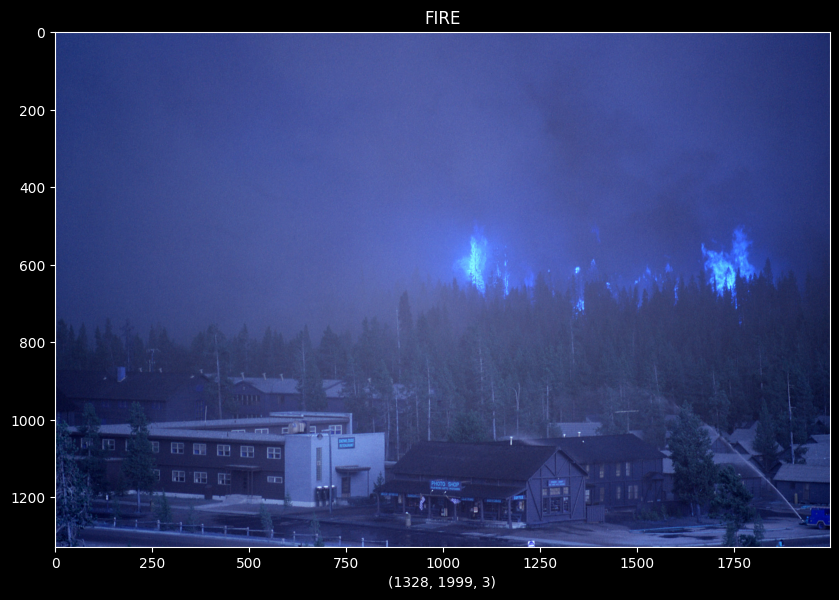

In [25]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][48])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][48])

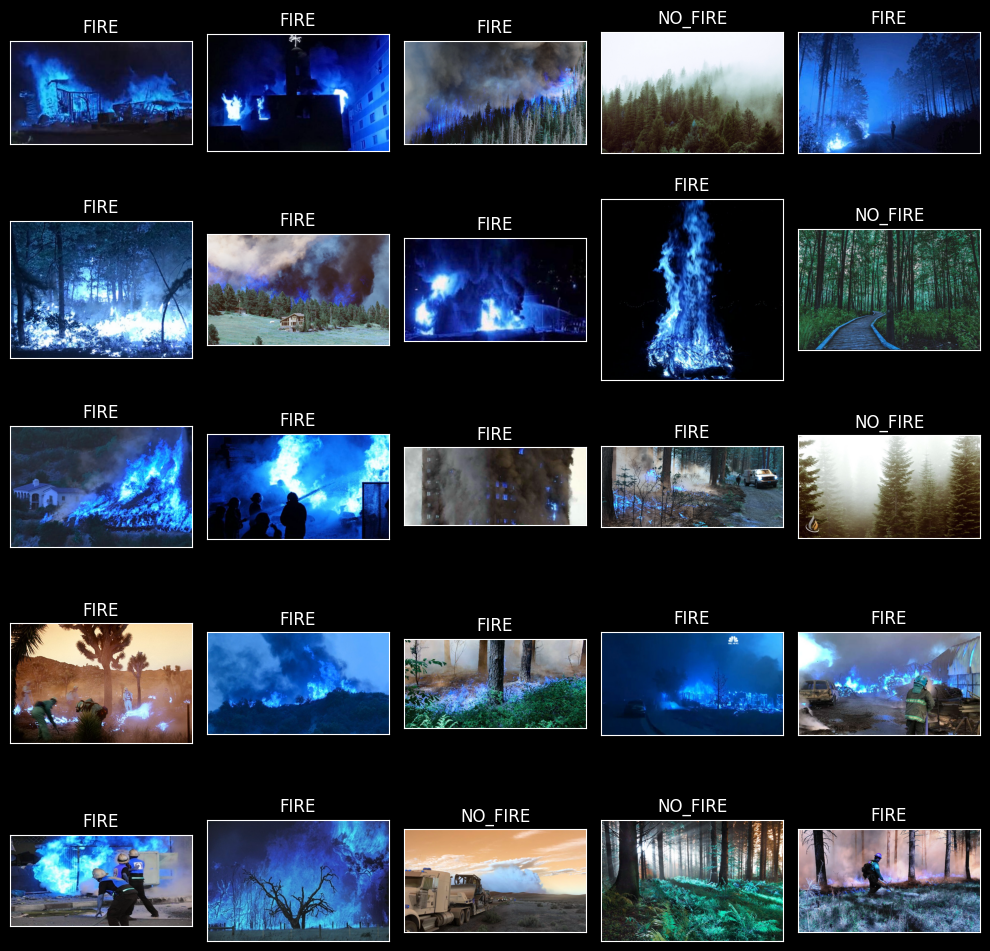

In [26]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Main_Train_Data["PNG"][i]))
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

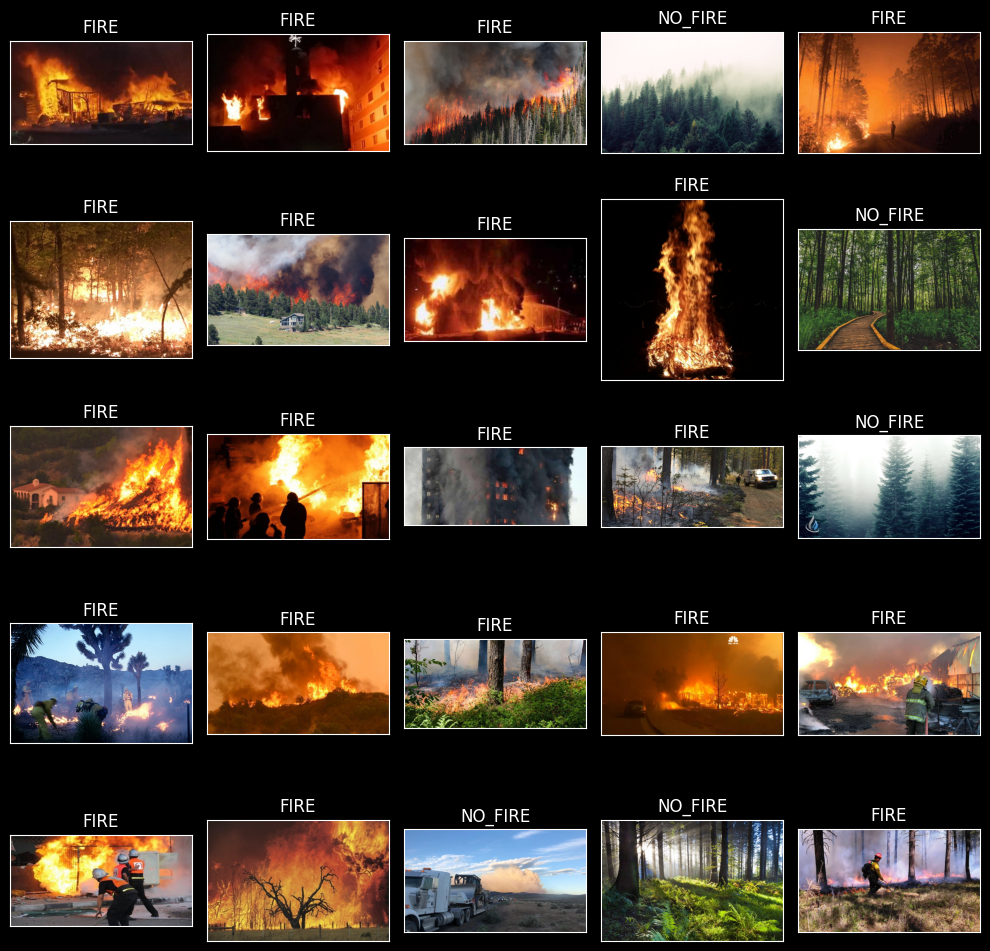

In [27]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    x = cv2.imread(Main_Train_Data["PNG"][i])
    x = cv2.cvtColor(x,cv2.COLOR_RGB2BGR)
    ax.imshow(x)
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

# DETERMINATION TRAIN AND TEST DATA

#### IMAGE GENERATOR

In [28]:
Train_Generator = ImageDataGenerator(rescale=1./255,
                                    shear_range=0.3,
                                    zoom_range=0.2,
                                    brightness_range=[0.2,0.9],
                                    rotation_range=30,
                                    horizontal_flip=True,
                                    vertical_flip=True,
                                    fill_mode="nearest",
                                    validation_split=0.1)

In [29]:
Test_Generator = ImageDataGenerator(rescale=1./255)

#### SPLITTING TRAIN AND TEST

In [30]:
Train_Data,Test_Data = train_test_split(Main_Train_Data,train_size=0.9,random_state=42,shuffle=True)

In [31]:
print("TRAIN SHAPE: ",Train_Data.shape)
print("TEST SHAPE: ",Test_Data.shape)

TRAIN SHAPE:  (899, 2)
TEST SHAPE:  (100, 2)


In [32]:
print(Train_Data.head(-1))
print("----"*20)
print(Test_Data.head(-1))

                                                   PNG CATEGORY
599  C:\Users\M_Aly\OneDrive - National University ...     FIRE
432  C:\Users\M_Aly\OneDrive - National University ...     FIRE
221  C:\Users\M_Aly\OneDrive - National University ...     FIRE
973  C:\Users\M_Aly\OneDrive - National University ...     FIRE
525  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
..                                                 ...      ...
71   C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
106  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
270  C:\Users\M_Aly\OneDrive - National University ...  NO_FIRE
860  C:\Users\M_Aly\OneDrive - National University ...     FIRE
435  C:\Users\M_Aly\OneDrive - National University ...     FIRE

[898 rows x 2 columns]
--------------------------------------------------------------------------------
                                                   PNG CATEGORY
453  C:\Users\M_Aly\OneDrive - National University ...     FIRE

In [33]:
print(Test_Data["CATEGORY"].value_counts())

CATEGORY
FIRE       79
NO_FIRE    21
Name: count, dtype: int64


In [34]:
encode = LabelEncoder()

In [35]:
For_Prediction_Class = encode.fit_transform(Test_Data["CATEGORY"])

#### How Generator Applied Image Look Like

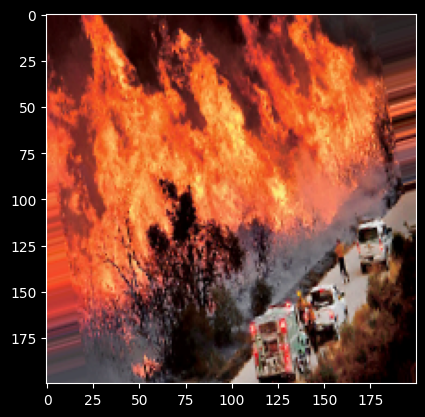

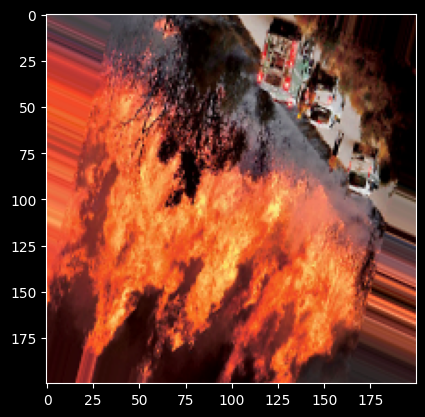

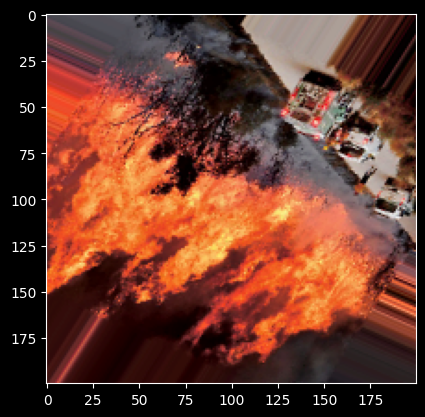

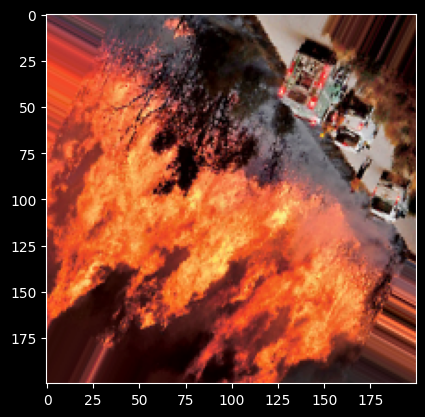

In [36]:
example_Image = Train_Data["PNG"][99]
Load_Image = image.load_img(example_Image,target_size=(200,200))
Array_Image = image.img_to_array(Load_Image)
Array_Image = Array_Image.reshape((1,) + Array_Image.shape)

i = 0
for batch in Train_Generator.flow(Array_Image,batch_size=1):
    plt.figure(i)
    IMG = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
plt.show()

#### APPLYING GENERATOR AND TRANSFORMATION TO TENSOR

In [37]:
Train_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="training")

Found 810 validated image filenames belonging to 2 classes.


In [38]:
Validation_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="validation")

Found 89 validated image filenames belonging to 2 classes.


In [39]:
Test_IMG_Set = Test_Generator.flow_from_dataframe(dataframe=Test_Data,
                                                 x_col="PNG",
                                                 y_col="CATEGORY",
                                                 color_mode="rgb",
                                                 class_mode="categorical",
                                                 batch_size=32)

Found 100 validated image filenames belonging to 2 classes.


#### CHECKING

In [40]:
for data_batch,label_batch in Train_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [41]:
for data_batch,label_batch in Validation_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [42]:
for data_batch,label_batch in Test_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [43]:
print("TRAIN: ")
print(Train_IMG_Set.class_indices)
print(Train_IMG_Set.classes[0:5])
print(Train_IMG_Set.image_shape)
print("---"*20)
print("VALIDATION: ")
print(Validation_IMG_Set.class_indices)
print(Validation_IMG_Set.classes[0:5])
print(Validation_IMG_Set.image_shape)
print("---"*20)
print("TEST: ")
print(Test_IMG_Set.class_indices)
print(Test_IMG_Set.classes[0:5])
print(Test_IMG_Set.image_shape)

TRAIN: 
{'FIRE': 0, 'NO_FIRE': 1}
[0, 0, 1, 0, 1]
(256, 256, 3)
------------------------------------------------------------
VALIDATION: 
{'FIRE': 0, 'NO_FIRE': 1}
[0, 0, 0, 0, 1]
(256, 256, 3)
------------------------------------------------------------
TEST: 
{'FIRE': 0, 'NO_FIRE': 1}
[0, 0, 1, 1, 0]
(256, 256, 3)


# CNN

In [44]:
Model = Sequential()

Model.add(Conv2D(32,(3,3),activation="relu",
                 input_shape=(256,256,3)))
Model.add(BatchNormalization())
Model.add(MaxPooling2D((2,2)))

#
Model.add(Conv2D(64,(3,3),
                 activation="relu",padding="same"))
Model.add(Dropout(0.2))
Model.add(MaxPooling2D((2,2)))

#
Model.add(Conv2D(128,(3,3),
                 activation="relu",padding="same"))
Model.add(Dropout(0.5))
Model.add(MaxPooling2D((2,2)))


#
Model.add(Flatten())
Model.add(Dense(256,activation="relu"))
Model.add(Dropout(0.5))
Model.add(Dense(1,activation="sigmoid"))

In [45]:
Call_Back = tf.keras.callbacks.EarlyStopping(monitor="loss",patience=5,mode="min")

In [46]:
Model.compile(optimizer="rmsprop",loss="binary_crossentropy",metrics=["accuracy"])

In [47]:
CNN_Model = Model.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=Call_Back,
                      epochs=25)

Epoch 1/25


26/26 [==============================] - 104s 4s/step - loss: 11.5279 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 2/25
26/26 [==============================] - 65s 2s/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 3/25
26/26 [==============================] - 79s 3s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 4/25
26/26 [==============================] - 68s 3s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 5/25
26/26 [==============================] - 69s 3s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 6/25
26/26 [==============================] - 79s 3s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 7/25
26/26 [==============================] - 81s 3s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 8/25
26/26

#### CHECKING

In [48]:
print(Model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 254, 254, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 127, 127, 64)      18496     
                                                                 
 dropout (Dropout)           (None, 127, 127, 64)      0         
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 63, 63, 64)        0

In [49]:
Model_Results = Model.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

4/4 [==============================] - 4s 998ms/step - loss: 0.6931 - accuracy: 0.5000
LOSS:  0.6931
ACCURACY:  0.50


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


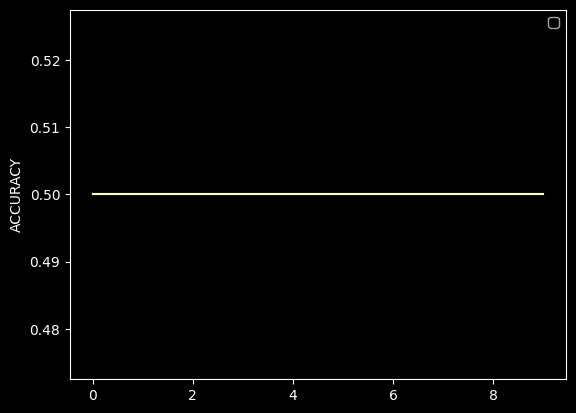

In [50]:
plt.plot(CNN_Model.history["accuracy"])
plt.plot(CNN_Model.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


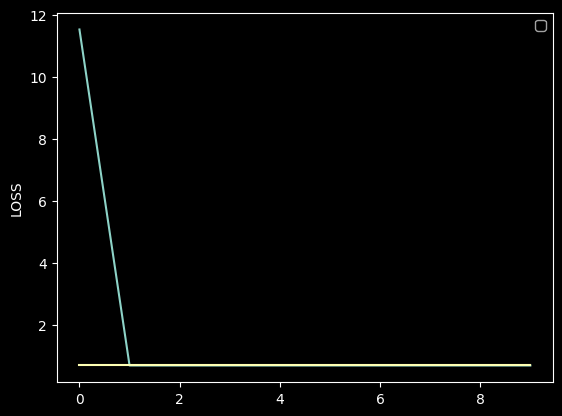

In [51]:
plt.plot(CNN_Model.history["loss"])
plt.plot(CNN_Model.history["val_loss"])
plt.ylabel("LOSS")
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


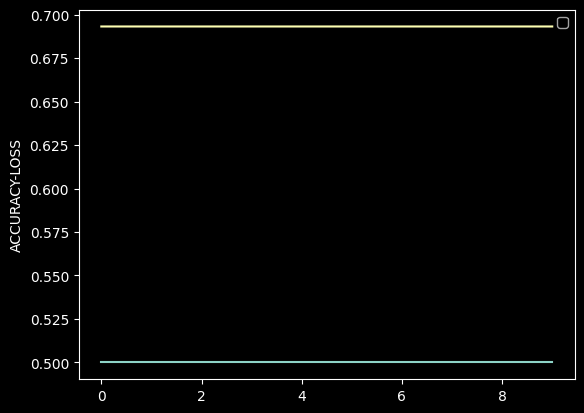

In [52]:
plt.plot(CNN_Model.history["val_accuracy"])
plt.plot(CNN_Model.history["val_loss"])
plt.ylabel("ACCURACY-LOSS")
plt.legend()
plt.show()

<Axes: >

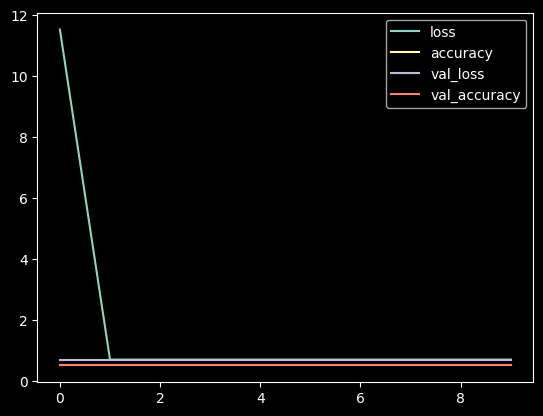

In [53]:
Dict_Summary_One = pd.DataFrame(CNN_Model.history)
Dict_Summary_One.plot()

#### PREDICTION

In [54]:
Prediction_One = Model.predict(Test_IMG_Set)
Prediction_One = Prediction_One.argmax(axis=-1)

4/4 [==============================] - 4s 820ms/step


In [55]:
print(Prediction_One)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [56]:
import numpy as np

# Assuming Model_Two is your trained model and Test_IMG_Set is your test image dataset

# Get the predictions (probabilities) for the test set
predictions = Model.predict(Test_IMG_Set)

# Convert the probabilities to class labels
Prediction_Class = np.argmax(predictions, axis=1)

print(Prediction_Class)


4/4 [==============================] - 3s 831ms/step
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [57]:
Prediction_Class = Model.predict(Test_IMG_Set)

4/4 [==============================] - 4s 816ms/step


In [58]:
print(Prediction_Class)

[[0.5000008 ]
 [0.49976578]
 [0.50000066]
 [0.5000009 ]
 [0.5000009 ]
 [0.5000008 ]
 [0.5000008 ]
 [0.5000008 ]
 [0.50000066]
 [0.5000008 ]
 [0.5000008 ]
 [0.5000007 ]
 [0.5000007 ]
 [0.50000066]
 [0.50000054]
 [0.50000066]
 [0.5000009 ]
 [0.5000009 ]
 [0.5000008 ]
 [0.50000054]
 [0.50000083]
 [0.5000009 ]
 [0.50000054]
 [0.50000083]
 [0.5000008 ]
 [0.5000008 ]
 [0.50000066]
 [0.50000066]
 [0.5000008 ]
 [0.50000083]
 [0.5000007 ]
 [0.50000083]
 [0.5000008 ]
 [0.5000008 ]
 [0.50000083]
 [0.5000008 ]
 [0.50000083]
 [0.5000008 ]
 [0.5000008 ]
 [0.5000008 ]
 [0.5000009 ]
 [0.5000008 ]
 [0.5000008 ]
 [0.5000008 ]
 [0.5000008 ]
 [0.5000007 ]
 [0.5000009 ]
 [0.50000066]
 [0.5000008 ]
 [0.50000083]
 [0.5000008 ]
 [0.5000007 ]
 [0.5000008 ]
 [0.50000066]
 [0.50000066]
 [0.5000008 ]
 [0.50000066]
 [0.5000008 ]
 [0.5000007 ]
 [0.5000009 ]
 [0.50000083]
 [0.50000066]
 [0.50000083]
 [0.5000007 ]
 [0.5000008 ]
 [0.5000009 ]
 [0.50000083]
 [0.50000066]
 [0.5000006 ]
 [0.50000066]
 [0.50000066]
 [0.50

* {'FIRE': 0, 'NO_FIRE': 1}

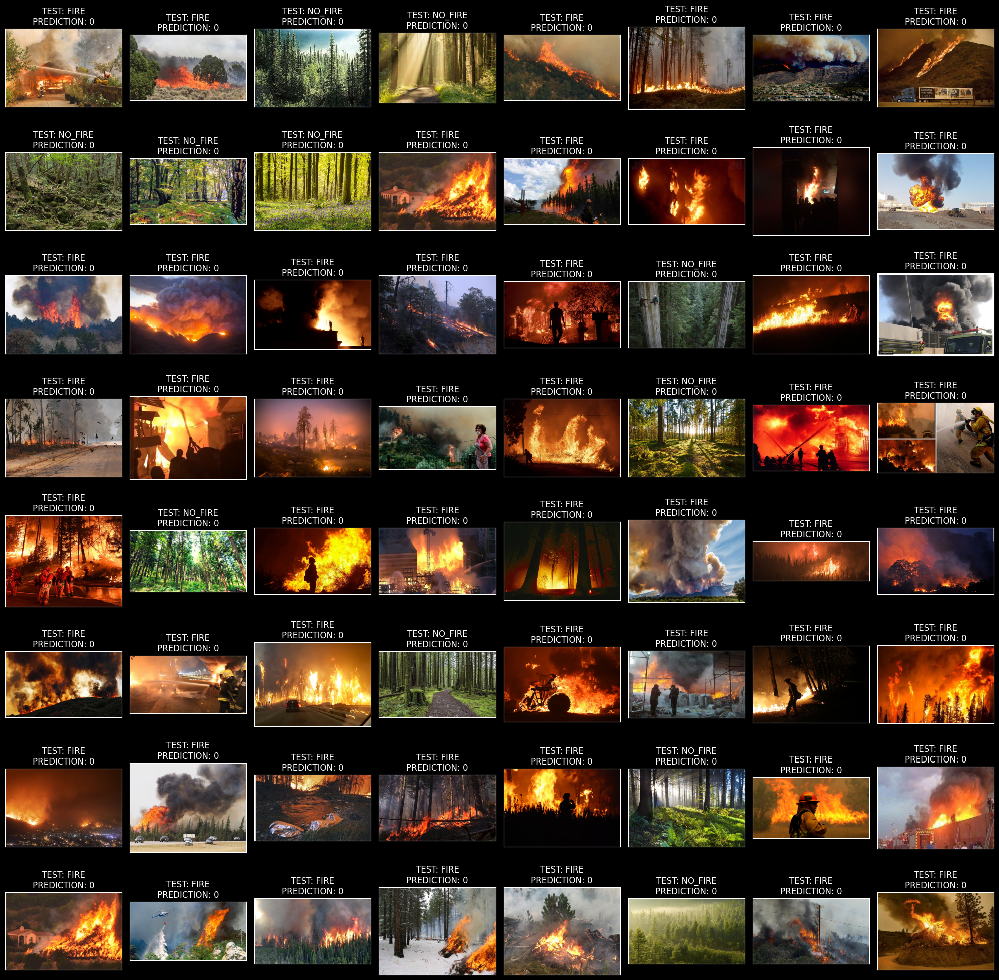

In [59]:

fig, axes = plt.subplots(nrows=8, ncols=8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = str(Test_Data["PNG"].iloc[i])
    img = cv2.imread(img_path)
    
    if img is not None:
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct color display
        ax.set_title(f"TEST: {Test_Data.CATEGORY.iloc[i]}\nPREDICTION: {Prediction_One[i]}")
    else:
        ax.set_title(f"Image not found:\n{img_path}")
    
plt.tight_layout()
plt.show()


#### CLASSIFICATION & CONFUSION REPORT

In [60]:
from sklearn.metrics import confusion_matrix

# Check the types of elements in For_Prediction_Class and Prediction_Class
print(set(type(x) for x in For_Prediction_Class))
print(set(type(x) for x in Prediction_Class))

# If Prediction_Class contains probabilities, convert them to class labels
# Assuming Prediction_Class contains probabilities as an example
import numpy as np

# Replace this example logic with your specific thresholding or argmax method
# Example for binary classification with a threshold
threshold = 0.5
Prediction_Class = [1 if x > threshold else 0 for x in Prediction_Class]

# Or for multi-class classification
# Prediction_Class = np.argmax(Prediction_Class, axis=1)

# Now compute the confusion matrix
cm = confusion_matrix(For_Prediction_Class, Prediction_Class)
print(cm)


{<class 'numpy.int32'>}
{<class 'numpy.ndarray'>}
[[ 1 78]
 [ 0 21]]


In [61]:
print(classification_report(For_Prediction_Class,Prediction_Class))

              precision    recall  f1-score   support

           0       1.00      0.01      0.02        79
           1       0.21      1.00      0.35        21

    accuracy                           0.22       100
   macro avg       0.61      0.51      0.19       100
weighted avg       0.83      0.22      0.09       100



#### PREDICTION FOR DIFFERENT SOURCE

* FIRE

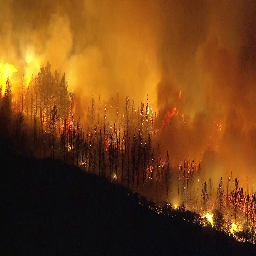

In [118]:
image_path = "C:/Users/M_Aly/OneDrive - National University of Sciences & Technology/Documents/6th Semester/Digital Image Processing/DIP_Project/fire_dataset/fire_images/fire.94.png"
img = image.load_img(image_path,target_size=(256,256))
x = image.img_to_array(img)
x = np.expand_dims(x,axis=0)
display(img)

In [108]:
Diff_Pred = Model.predict(x)
Diff_Pred = Diff_Pred.argmax(axis=-1)
print(Diff_Pred)

1/1 [==============================] - 0s 385ms/step
[0]


* NOT FIRE

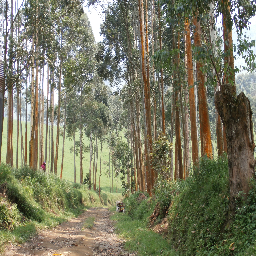

In [113]:
image_path_Two = "C:/Users/M_Aly/OneDrive - National University of Sciences & Technology/Documents/6th Semester/Digital Image Processing/DIP_Project/fire_dataset/non_fire_images/non_fire.56.png"
img_Two = image.load_img(image_path_Two,target_size=(256,256))
x_Two = image.img_to_array(img_Two)
x_Two = np.expand_dims(x_Two,axis=0)
display(img_Two)

In [114]:
Diff_Pred_Two = Model.predict(x_Two)
Diff_Pred_Two = Diff_Pred_Two.argmax(axis=-1)
print(Diff_Pred_Two)

1/1 [==============================] - 0s 57ms/step
[0]


# CNN-RCNN

In [87]:
Model_Three = Sequential()

Model_Three.add(Conv2D(12,(3,3),activation="relu",
                 input_shape=(256,256,3)))
Model_Three.add(BatchNormalization())
Model_Three.add(MaxPooling2D((2,2)))

#
Model_Three.add(Conv2D(24,(3,3),
                 activation="relu"))
Model_Three.add(Dropout(0.2))
Model_Three.add(MaxPooling2D((2,2)))


#
Model_Three.add(TimeDistributed(Flatten()))
Model_Three.add(Bidirectional(LSTM(32,
                                  return_sequences=True,
                                  dropout=0.5,
                                  recurrent_dropout=0.5)))
Model_Three.add(Bidirectional(GRU(32,
                                  return_sequences=True,
                                  dropout=0.5,
                                  recurrent_dropout=0.5)))

#
Model_Three.add(Flatten())

Model_Three.add(Dense(256,activation="relu"))
Model_Three.add(Dropout(0.5))
Model_Three.add(Dense(2,activation="softmax"))

In [88]:
Model_Three.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

In [89]:
RCNN_Model = Model_Three.fit(Train_IMG_Set,
                          validation_data=Validation_IMG_Set,
                          callbacks=Call_Back,
                      epochs=100)

Epoch 1/100
26/26 [==============================] - 58s 2s/step - loss: 0.5245 - accuracy: 0.8086 - val_loss: 0.4631 - val_accuracy: 0.7528
Epoch 2/100
26/26 [==============================] - 45s 2s/step - loss: 0.1807 - accuracy: 0.9235 - val_loss: 0.4984 - val_accuracy: 0.7528
Epoch 3/100
26/26 [==============================] - 45s 2s/step - loss: 0.1754 - accuracy: 0.9198 - val_loss: 0.4580 - val_accuracy: 0.7528
Epoch 4/100
26/26 [==============================] - 45s 2s/step - loss: 0.1987 - accuracy: 0.9284 - val_loss: 0.4592 - val_accuracy: 0.7528
Epoch 5/100
26/26 [==============================] - 45s 2s/step - loss: 0.1605 - accuracy: 0.9346 - val_loss: 0.3858 - val_accuracy: 0.7640
Epoch 6/100
26/26 [==============================] - 45s 2s/step - loss: 0.1468 - accuracy: 0.9444 - val_loss: 0.3516 - val_accuracy: 0.7640
Epoch 7/100
26/26 [==============================] - 45s 2s/step - loss: 0.1381 - accuracy: 0.9506 - val_loss: 0.5068 - val_accuracy: 0.7640
Epoch 8/100
2

In [90]:
print(Model_Three.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 12)      336       
                                                                 
 batch_normalization_1 (Bat  (None, 254, 254, 12)      48        
 chNormalization)                                                
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 127, 127, 12)      0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 24)      2616      
                                                                 
 dropout_4 (Dropout)         (None, 125, 125, 24)      0         
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 62, 62, 24)       

In [91]:
Model_Results_Three = Model_Three.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Results_Three[0])
print("ACCURACY:  " + "%.2f" % Model_Results_Three[1])

4/4 [==============================] - 3s 683ms/step - loss: 0.0853 - accuracy: 0.9700
LOSS:  0.0853
ACCURACY:  0.97


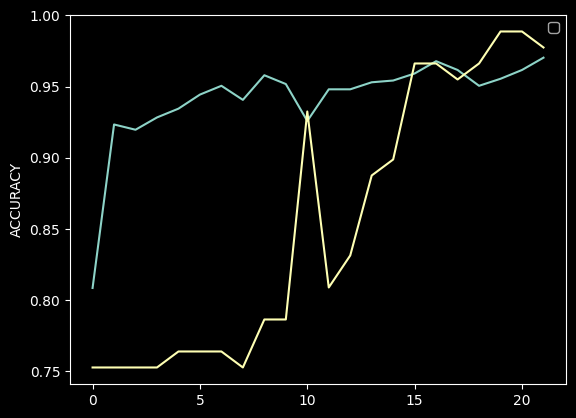

In [92]:
plt.plot(RCNN_Model.history["accuracy"])
plt.plot(RCNN_Model.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

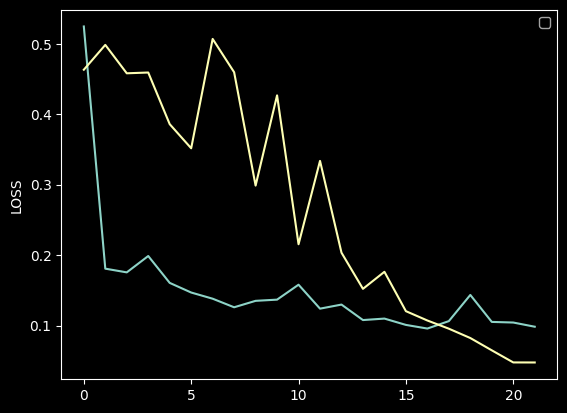

In [93]:
plt.plot(RCNN_Model.history["loss"])
plt.plot(RCNN_Model.history["val_loss"])
plt.ylabel("LOSS")
plt.legend()
plt.show()

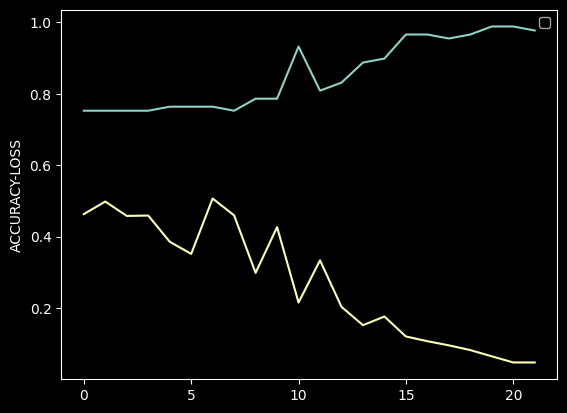

In [94]:
plt.plot(RCNN_Model.history["val_accuracy"])
plt.plot(RCNN_Model.history["val_loss"])
plt.ylabel("ACCURACY-LOSS")
plt.legend()
plt.show()

<Axes: >

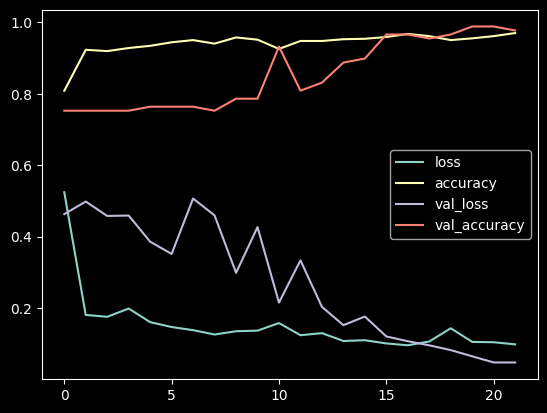

In [95]:
Dict_Summary_Three = pd.DataFrame(RCNN_Model.history)
Dict_Summary_Three.plot()

In [96]:
Prediction_Three = Model_Three.predict(Test_IMG_Set)
Prediction_Three = Prediction_Three.argmax(axis=-1)

4/4 [==============================] - 3s 640ms/step


In [97]:
print(Prediction_Three)

[0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0]


* {'FIRE': 0, 'NO_FIRE': 1}

In [98]:
import numpy as np

# Assuming Model_Two is your trained model and Test_IMG_Set is your test image dataset

# Get the predictions (probabilities) for the test set
predictions = Model_Three.predict(Test_IMG_Set)

# Convert the probabilities to class labels
Prediction_Class_Three = np.argmax(predictions, axis=1)



4/4 [==============================] - 3s 668ms/step


In [99]:
print(Prediction_Class_Three)

[0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0]


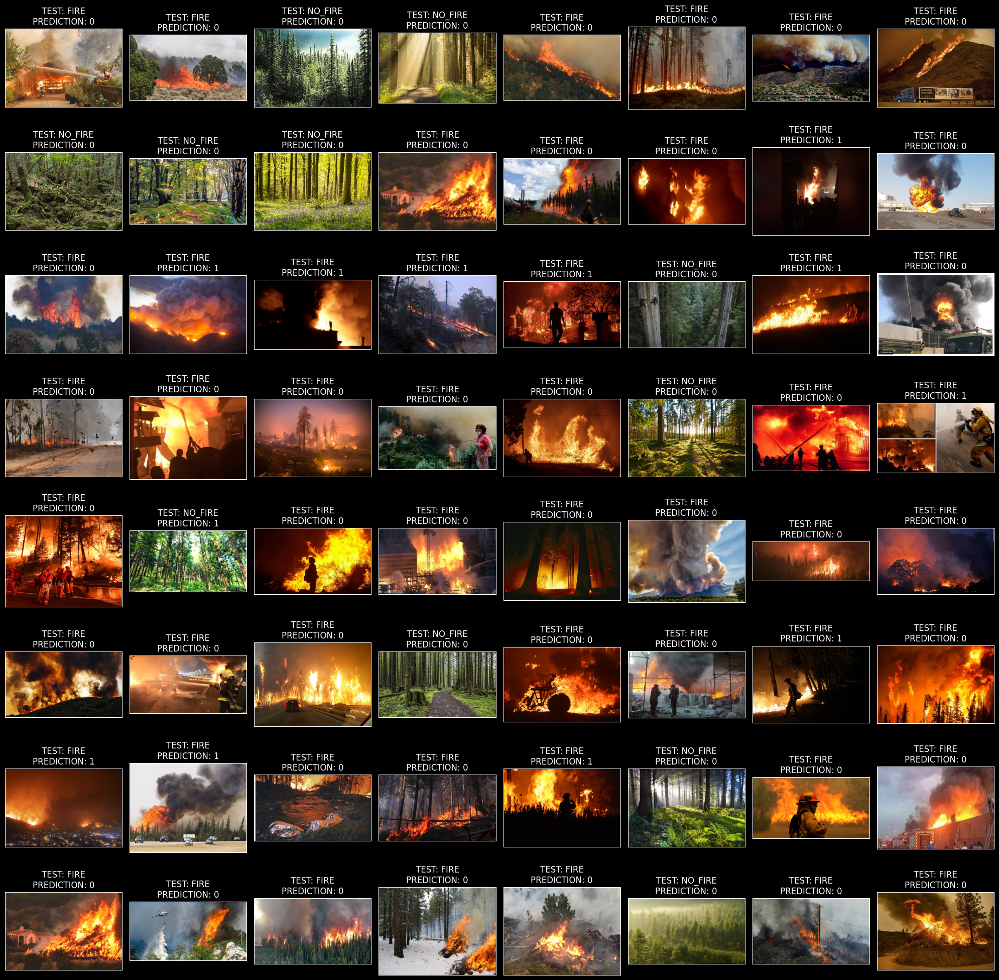

In [100]:
import cv2
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=8, ncols=8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = str(Test_Data["PNG"].iloc[i])
    img = cv2.imread(img_path)
    
    if img is not None:
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct color display
        ax.set_title(f"TEST: {Test_Data.CATEGORY.iloc[i]}\nPREDICTION: {Prediction_Two[i]}")
    else:
        ax.imshow(np.zeros((10, 10, 3), dtype=np.uint8))  # Display a blank image
        ax.set_title(f"Image not found:\n{img_path}")
    
plt.tight_layout()
plt.show()


#### CLASSIFICATION & CONFUSION REPORT

In [101]:
print(classification_report(For_Prediction_Class,Prediction_Three))

              precision    recall  f1-score   support

           0       0.83      0.86      0.84        79
           1       0.39      0.33      0.36        21

    accuracy                           0.75       100
   macro avg       0.61      0.60      0.60       100
weighted avg       0.74      0.75      0.74       100



In [102]:
print(confusion_matrix(For_Prediction_Class,Prediction_Three))

[[68 11]
 [14  7]]


##### PREDICTION FOR DIFFERENT SOURCE

* FIRE

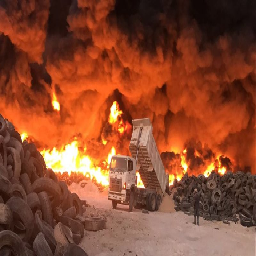

In [103]:
image_path = "C:/Users/M_Aly/OneDrive - National University of Sciences & Technology/Documents/6th Semester/Digital Image Processing/DIP_Project/fire_dataset/fire_images/fire.90.png"
img = image.load_img(image_path,target_size=(256,256))
x = image.img_to_array(img)
x = np.expand_dims(x,axis=0)
display(img)

In [104]:
Diff_Pred = Model_Three.predict(x)
Diff_Pred = Diff_Pred.argmax(axis=-1)
print(Diff_Pred)

1/1 [==============================] - 1s 954ms/step
[0]


[0]

* NOT FIRE

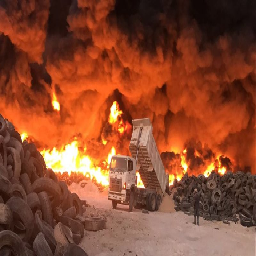

In [116]:
image_path_Two = "C:/Users/M_Aly/OneDrive - National University of Sciences & Technology/Documents/6th Semester/Digital Image Processing/DIP_Project/fire_dataset/non_fire_images/non_fire.90.png"
img_Two = image.load_img(image_path_Two,target_size=(256,256))
x_Two = image.img_to_array(img_Two)
x_Two = np.expand_dims(x_Two,axis=0)
display(img_Two)

In [117]:
Diff_Pred_Three = Model_Three.predict(x_Two)
Diff_Pred_Three = Diff_Pred_Three.argmax(axis=-1)
print(Diff_Pred_Three)

1/1 [==============================] - 0s 225ms/step
[0]


[1]